## MT571 - Projeto de Implementação Computacional

Carregar bibliotecas

In [1]:
#importacao de bibliotecas
using LinearAlgebra
using ControlSystems
using Plots
using Random
using Statistics

include("ARX_ON.jl") #pacote próprio

ARX_K (generic function with 1 method)

Inicialização do sistema Massa-Mola-Amortecedor e geração de sua resposta a ser identificada

In [2]:
#parâmetros arbitrários de um sistema
m = 1
c = 2
k = 50

A = [
    0 1;
    -k/m -c/m
]

B = [0 ; 1/m]

C = [1 0]

D = 0
#modelo de espaço de estados
sys = ss(A,B,C,D)

#condicoes numericas
dt = 2e-5;
maxT = 6;
ns = round(Int,maxT/dt)+1;
t = 0:dt:maxT;

#estado inicial
x0 = [0; 0];

#força e geração do sinal de saída
U = ones(1,ns);#PulseGen(ns); 
Y,_,_ = lsim(sys,U,t,x0);

Parâmetros do ARX e dos otimizadores

In [10]:
na= 2
nb = 1
η = (1:1000)*1e-4
tol = 1e-5;

Geração dos coeficientes do ARX MMQ, simulação do sistema identificado e organização dos parâmetros (de uma implementação p/ outra)

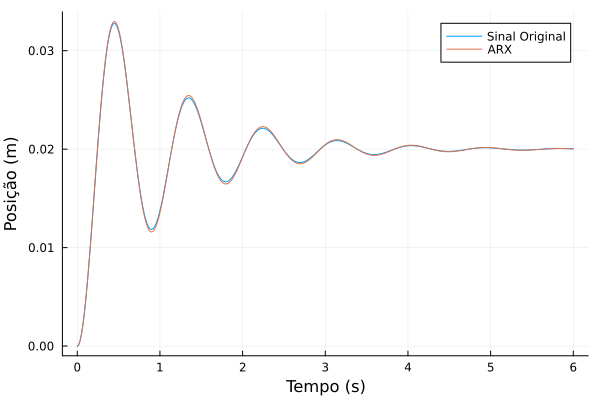

In [9]:
sysARX,or_Coef,H,b = ARX_K(Y,U,na,nb,dt); #geração do sistema e dos coeficientes
Y_or,_,_ = lsim(sysARX,U,t,x0) #resposta do ARX original
θ = [or_Coef[2],or_Coef[3],or_Coef[1]] #implementação dos meus coeficientes, na IC, foi feita em uma ordem inversa a deste trabalho. 

grafico1 = plot(t, 
[Y' Y_or'],
labels=["Sinal Original" "ARX"],
ylabel = "Posição (m)", 
xlabel="Tempo (s)"
)

png(grafico1,"original_total")

grafico1

Etapa onde o microcontrolador adquiriria os dados

In [5]:
Arduino = ControllerInit(0.01,na,nb,ns,tol); #inicialização da estrutura do microcontrolador
grad_Bulid(Arduino,ns,Y,U) #geração das matrizes auxiliares do gradiente da MSE

Arduino.M\Arduino.L #theta estimado

3-element Vector{Float64}:
  0.7522499965945123
 -0.7522474974238704
  3.400662711870599e-6

Número de bytes das estruturas:

In [12]:
println(sizeof(Controller)/8)
println(sizeof(AdamOpt)/8)
println(sizeof(Y)/8)

10.0
7.0
300001.0


Hiperotimização do parâmetro ETA para o GDS

Dois casos são rodados, um que a seed é vetor 0 e a outra que a seed é aleatória

In [11]:
norma = zeros(1000)
for i = 1:1000
    Arduino.θ = rand(na+nb)#[0,0,0]#;
    Arduino.η = η[i];
    GDS(Arduino);
    norma[i] = norm(θ-Arduino.θ)/norm(θ);
end

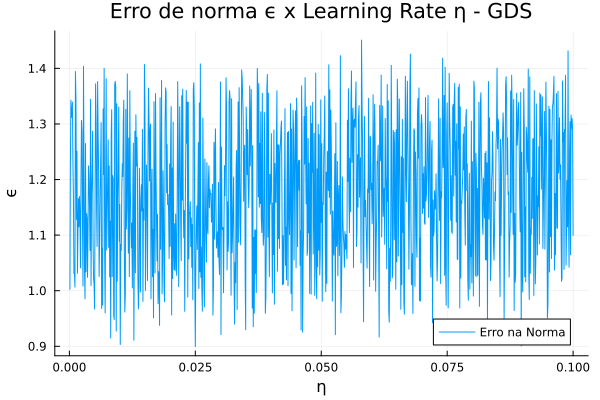

In [12]:
grafico = plot(
    (1:1000)*1e-4, 
    norma, 
    labels="Erro na Norma",
    ylabel = "ϵ", 
    xlabel = "η",
    title  = "Erro de norma ϵ x Learning Rate η - GDS",
);

png(grafico,"random-GDS-1")

grafico

Hiperotimização do parâmetro ETA para o ADAM

Dois casos são rodados, um que a seed é vetor 0 e a outra que a seed é aleatória

In [14]:
norma2 = zeros(1000)
for i = 1:1000
    Arduino.θ = rand(na+nb)#[0,0,0]#rand(na+nb);
    Arduino.η = η[i];
    AdamRun(Arduino);
    norma2[i] = norm(θ-Arduino.θ)/norm(θ);
end

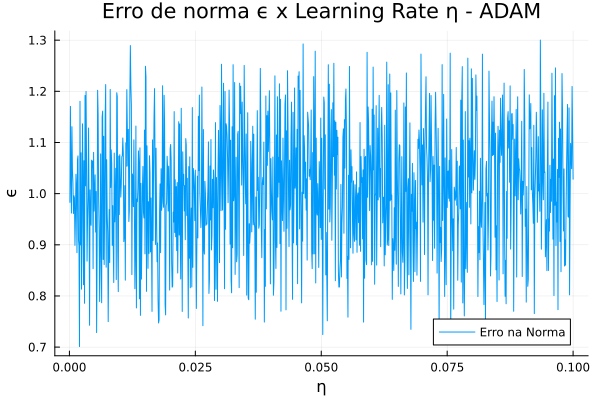

In [15]:
grafico = plot(
    (1:1000)*1e-4, 
    norma2,  
    labels="Erro na Norma",
    ylabel = "ϵ", 
    xlabel = "η",
    title  = "Erro de norma ϵ x Learning Rate η - ADAM",
);

png(grafico,"random-adam-1")

grafico
